In [1]:
import plotly.graph_objects as go
import pandas as pd
import numpy as np
from numpy import pi as π, sin,cos

In [4]:
def analytical_CHSH(theta_FSS, Pt=1.0):
    
    """ Analytical model for CHSH quantity """
    if Pt == 1.0:
        P_HH = P_HV = P_VH = P_VV = 0.0
    else:
        P_HH = 0.0030
        P_HV = 0.0138
        P_VH = 0.0278
        P_VV = 0.0447
    
    return np.sqrt(2)*(Pt*(cos(theta_FSS) + 1) + P_HH + P_VV - P_HV - P_VH)
    
def model_noise(θ, α, β, Pt=1.0):
    
    # 2. Probability assignment without dynamic re-scaling
    if Pt == 1.0:
        P_HH = P_HV = P_VH = P_VV = 0.0
    else:
        P_HH = 0.0030
        P_HV = 0.0138
        P_VH = 0.0278  # Using the corrected value
        P_VV = 0.0447
    
    # Pre-compute trigonometric values
    C_a = cos(α)
    S_a = sin(α)
    C_ab = cos(α + β)
    S_ab = sin(α + β)
    C_theta = cos(θ)
    
    # Term 1: Pt * (1/2) * [...]
    term1 = (Pt / 2.0) * (
        C_a**4 + S_a**4 + 2 * (S_a**2) * (C_a**2) * C_theta +
        C_ab**4 + S_ab**4 + 2 * (S_ab**2) * (C_ab**2) * C_theta
    )
    
    # Term 2: ((P_HH + P_VV)/2) * [...]
    term2 = ((P_HH + P_VV) / 2.0) * (
        C_a**4 + S_a**4 + C_ab**4 + S_ab**4
    )
    
    # Term 3: (P_HV + P_VH) * [...]
    term3 = (P_HV + P_VH) * (
        (C_a**2) * (S_a**2) + (C_ab**2) * (S_ab**2)
    )
    
    return term1 + term2 + term3

In [5]:
def ϵ(y_true:np.ndarray, y_pred:np.ndarray):
    y_true_flat = y_true.flatten()
    y_pred_flat = y_pred.flatten()
    # Manually compute epsilon: Sum((y_i - y_hat_i)^2) / Sum((y_i - y_mean)^2)
    sum_squared_residuals = np.sum((y_true_flat - y_pred_flat) ** 2)
    total_sum_squares = np.sum((y_true_flat - np.mean(y_true_flat)) ** 2)
    return sum_squared_residuals / total_sum_squares

In [28]:
def plotter(α: np.float64=0.25*π):
    
    N = 500
    dim_theta, dim_beta = [N,N]
    theta = np.linspace(0, 2*np.pi, dim_theta)
    beta = np.linspace(0, np.pi, dim_beta)
    
    analytical_df = np.array([[model_noise(θ=θ, β=β, α=α, Pt=0.9107) for θ in theta] for β in beta], dtype=np.float64).T
    ϵ_val = ϵ(y_true=analytical_df, y_pred=simulation_df)
    
    fig = go.Figure()
    
    tick_font_size = 15
    axes_label_font_size = 30
    colorbar_tick_fontsize = 18
    title_fontsize = 30
    
    font_family= "Arial"
    
    # Conditionally plot the analytical model
    fig.add_trace(go.Surface(
        y=theta,
        x=beta, 
        z=analytical_df,
        colorscale='Plasma',
        opacity=1,
        name='Analytical',
        colorbar=dict(
            x=0.85,
            lenmode='fraction',
            len=0.9,
            tickfont=dict(size=tick_font_size, family=font_family),
            # --- ADDED: Custom ticks to the colorbar ---
            tickmode='array',
            tickvals=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.89, 1.0],
            ticktext=['0.1','0.2', '0.3' '0.4', '0.5', '0.6', '0.7', '0.8', '0.89 = SL', '1.0']
        )
    ))
    
    fig.add_trace(go.Surface(
        z=0.89 * np.ones(shape=(len(theta), len(beta))), 
        x=beta, 
        y=theta, 
        opacity=0.5,
        colorscale='gray',
        showscale=False 
    ))
    
    alpha_val = (α / np.pi)/2
    a_num, a_den = alpha_val.as_integer_ratio()
    
    if a_num == 0:
        a_str = "0"
        a_str_file = "0"
    elif a_num == 1:
        if a_den ==1:
            a_str = f"π"
            a_str_file = f"pi"
        else:
            a_str = f"π/{a_den}"
            a_str_file = f"pi_{a_den}"
    else:
        if a_den ==1:
            a_str = f"π"
            a_str_file = f"pi"
        else:
            a_str = f"{a_num}π/{a_den}"
            a_str_file = f"{a_num}pi_{a_den}"
    
    fig.update_layout(
        title=dict(
                text=f"Correlation Probability for Entangled states,\nα = {a_str},\t\tϵ={ϵ_val:1.3e}",
                font=dict(size=title_fontsize, family=font_family),
                x=0.1, y=1),
        autosize=False,
        width=900,
        height=900,
        
        scene=dict(
            zaxis=dict(
                title='',
                range=[0, 1.1],
                # --- REVERTED: Back to standard numeric ticks for a cleaner Z-axis ---
                tickvals=[0.2, 0.4, 0.6, 0.8, 1.0], 
                tickfont=dict(size=tick_font_size, family=font_family) 
            ),
            
            yaxis=dict(
                # --- FIX 2: Added <br> before the text to push it away from the numbers ---
                title=dict(
                    text='θ',#text='<br><br>θ',
                    font=dict(size=axes_label_font_size, family=font_family)), 
                tickfont=dict(size=tick_font_size, family=font_family),                   
                tickmode='array',
                tickvals=[0, np.pi/3, 2*np.pi/3, np.pi, 4*np.pi/3, 5*np.pi/3, 2*np.pi],
                ticktext=['0', 'π/3', '2π/3', 'π', '4π/3', '5π/3', '2π'],
                range=[0, 2 * np.pi]
            ),
            
            xaxis=dict(
                # --- FIX 2: Added <br> before the text to push it away from the numbers ---
                title=dict(
                    text='β',#text='β',
                    font=dict(size=axes_label_font_size, family=font_family)), 
                tickfont=dict(size=tick_font_size, family=font_family),                   
                tickmode='array',
                tickvals=[0, np.pi/4, np.pi/2, 3*np.pi/4, np.pi],
                ticktext=['0', 'π/4', 'π/2', '3π/4', 'π'],
                range=[0, np.pi]
            )
        ),
        
        scene_camera=dict(
            eye=dict(x=-1.6, y=-1.6, z=1.0) 
        )
    )
    
    fig_filename=f"FigS1.html"
    fig.write_html(fig_filename)
    fig.show()

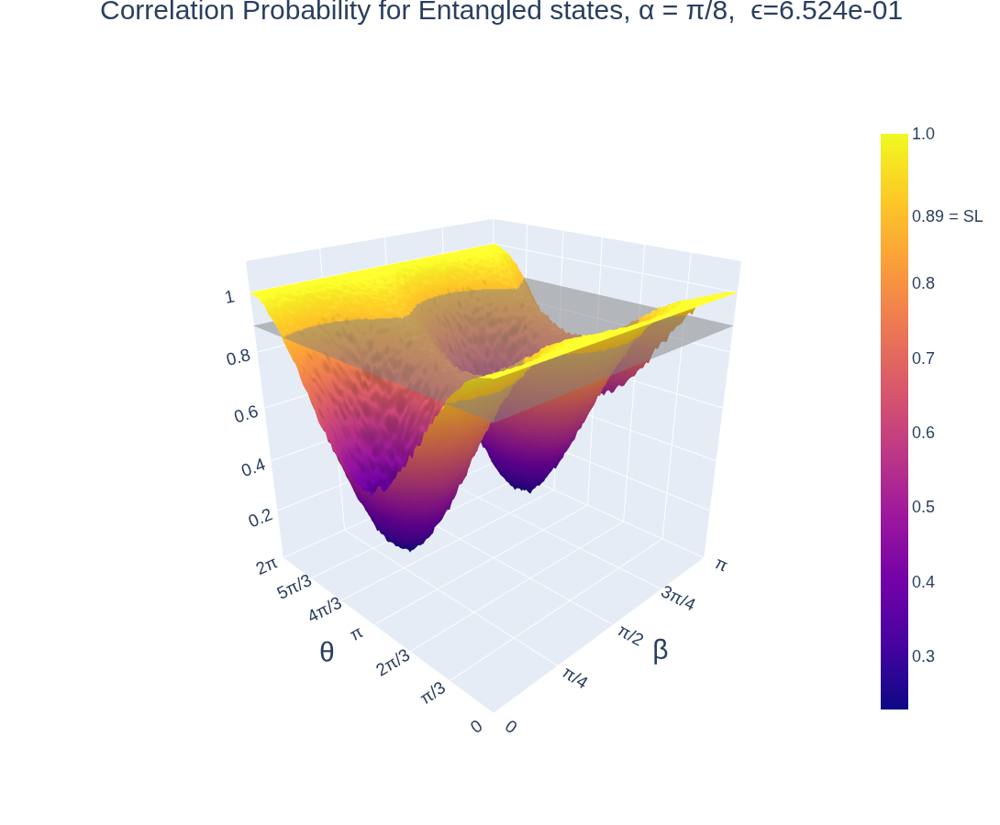

In [29]:
plotter(plot_analytical=False)

In [38]:
import plotly.graph_objects as go
from plotly.subplots import make_subplots
import pandas as pd
import numpy as np
from numpy import pi as π, sin, cos

def analyticalP_Corr(θ, α, β, Pt=1.0):
    # Probability assignment
    if Pt == 1.0:
        P_HH = P_HV = P_VH = P_VV = 0.0
    else:
        P_HH = 0.0030
        P_HV = 0.0138
        P_VH = 0.0278  
        P_VV = 0.0447
    
    # Pre-compute trigonometric values
    C_a = cos(α)
    S_a = sin(α)
    C_ab = cos(α + β)
    S_ab = sin(α + β)
    C_theta = cos(θ)
    
    # Term 1: Pt * (1/2) * [...]
    term1 = (Pt / 2.0) * (
        C_a**4 + S_a**4 + 2 * (S_a**2) * (C_a**2) * C_theta +
        C_ab**4 + S_ab**4 + 2 * (S_ab**2) * (C_ab**2) * C_theta
    )
    
    # Term 2: ((P_HH + P_VV)/2) * [...]
    term2 = ((P_HH + P_VV) / 2.0) * (
        C_a**4 + S_a**4 + C_ab**4 + S_ab**4
    )
    
    # Term 3: (P_HV + P_VH) * [...]
    term3 = (P_HV + P_VH) * (
        (C_a**2) * (S_a**2) + (C_ab**2) * (S_ab**2)
    )
    
    return term1 + term2 + term3

def CR_quantity(θ, α, β):
    # Analytical expression for CR
    term1 = cos(θ) * sin(2 * (α + β)) * ((1 / np.sqrt(2)) + sin(2 * α))
    term2 = cos(2 * (α + β)) * (cos(2 * α) - (1 / np.sqrt(2)))
    term3 = cos(2 * α) + (1 / np.sqrt(2))
    return term1 + term2 + term3

def plotter(α: np.float64 = 0.25*π):
    N = 500
    dim_theta, dim_beta = [N, N]
    theta = np.linspace(0, 2*np.pi, dim_theta)
    beta = np.linspace(0, np.pi, dim_beta)
    
    # Generate matrices for the surfaces
    analytical_df = np.array([[analyticalP_Corr(θ=th, α=α, β=b, Pt=0.9107) for th in theta] for b in beta], dtype=np.float64).T
    cr_df = np.array([[np.abs(CR_quantity(θ=th, α=α, β=b)) for th in theta] for b in beta], dtype=np.float64).T
    
    # Create 1x2 subplots
    fig = make_subplots(
        rows=1, cols=2,
        specs=[[{'type': 'surface'}, {'type': 'surface'}]],
        subplot_titles=(r"Correlation Probability", r"Bell quantity")
    )
    
    tick_font_size = 15
    axes_label_font_size = 30
    title_fontsize = 30
    font_family = "Arial"
    
    # ------------------ SUBPLOT 1: P_Corr ------------------
    fig.add_trace(go.Surface(
        y=theta, x=beta, z=analytical_df,
        colorscale='Plasma', opacity=1, name='Analytical P_Corr',
        colorbar=dict(
            x=0.42, 
            lenmode='fraction', len=0.9,
            tickfont=dict(size=tick_font_size, family=font_family),
            tickmode='array',
            tickvals=[0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.89, 1.0],
            ticktext=['0.1', '0.2', '0.3', '0.4', '0.5', '0.6', '0.7', '0.8', '0.89 = SL', '1.0'] 
        )
    ), row=1, col=1)
    
    # Reference Plane for Subplot 1
    fig.add_trace(go.Surface(
        z=0.89 * np.ones(shape=(len(theta), len(beta))), 
        x=beta, y=theta, opacity=0.5, colorscale='gray', showscale=False 
    ), row=1, col=1)

    # ------------------ SUBPLOT 2: |CR| Quantity ------------------
    cr_max = 2 * np.sqrt(2)
    
    fig.add_trace(go.Surface(
        y=theta, x=beta, z=cr_df,
        colorscale='Plasma', opacity=1, name='|CR| Quantity',
        colorbar=dict(
            x=1.0, 
            lenmode='fraction', len=0.9,
            tickfont=dict(size=tick_font_size, family=font_family),
            tickmode='array',
            tickvals = [0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1.4, 1.6, 1.8, 2.0, 2.2, 2.4, 2.6, 2.8, cr_max,3],
            ticktext = ['0', '0.2', '0.4', '0.6', '0.8', '1.0', '1.2', '1.4', '1.6', '1.8', '2.0', '2.2', '2.4', '2.6', '2.8', '2√2','']
        )
    ), row=1, col=2)
    
    # Reference Plane for Subplot 2
    fig.add_trace(go.Surface(
        z=2.0* np.ones(shape=(len(theta), len(beta))), 
        x=beta, y=theta, opacity=0.5, colorscale='gray', showscale=False 
    ), row=1, col=2)
    
    # Alpha String Logic
    alpha_val = (α / np.pi) / 2
    a_num, a_den = alpha_val.as_integer_ratio()
    
    if a_num == 0:
        a_str = "0"
    elif a_num == 1:
        if a_den == 1:
            a_str = f"π"
        else:
            a_str = f"π/{a_den}"
    else:
        if a_den == 1:
            a_str = f"π"
        else:
            a_str = f"{a_num}π/{a_den}"
            
    # Shared X and Y axes configuration
    shared_xaxis = dict(
        title=dict(text='β', font=dict(size=axes_label_font_size, family=font_family)), 
        tickfont=dict(size=tick_font_size, family=font_family),                   
        tickmode='array',
        tickvals=[0, np.pi/4, np.pi/2, 3*np.pi/4, np.pi],
        ticktext=['0', 'π/4', 'π/2', '3π/4', 'π'],
        range=[0, np.pi]
    )
    
    shared_yaxis = dict(
        title=dict(text='θ', font=dict(size=axes_label_font_size, family=font_family)), 
        tickfont=dict(size=tick_font_size, family=font_family),                   
        tickmode='array',
        tickvals=[0, np.pi/3, 2*np.pi/3, np.pi, 4*np.pi/3, 5*np.pi/3, 2*np.pi],
        ticktext=['0', 'π/3', '2π/3', 'π', '4π/3', '5π/3', '2π'],
        range=[0, 2 * np.pi]
    )

    shared_camera = dict(eye=dict(x=-1.6, y=-1.6, z=1.0))

    # Scene 1: For P_Corr^T
    scene1_config = dict(
        zaxis=dict(
            title='', range=[0, 1.1],
            tickvals=[0.2, 0.4, 0.6, 0.8, 1.0], 
            tickfont=dict(size=tick_font_size, family=font_family) 
        ),
        yaxis=shared_yaxis, xaxis=shared_xaxis, camera=shared_camera,
        # --- FIX: Forced Manual Aspect Mode for Square X/Y ---
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.8) # Adjust Z if needed (0.8 keeps a nice elevation)
    )

    # Scene 2: For |CR| Quantity
    scene2_config = dict(
        zaxis=dict(
            title='', range=[0, cr_max],
            tickmode='array',
            tickvals=[0, 1, 2, cr_max],
            ticktext=['', '1', '2', '2√2'], 
            tickfont=dict(size=tick_font_size, family=font_family) 
        ),
        yaxis=shared_yaxis, xaxis=shared_xaxis, camera=shared_camera,
        # --- FIX: Forced Manual Aspect Mode for Square X/Y ---
        aspectmode='manual',
        aspectratio=dict(x=1, y=1, z=0.8)
    )
    
    fig.update_layout(
        title=dict(
            text=f"Correlation Probability and |CR| for Entangled states, α = {a_str}",
            font=dict(size=title_fontsize, family=font_family),
            x=0.5, y=0.95, xanchor='center'
        ),
        autosize=False,
        width=1600, 
        height=900,
        scene=scene1_config,   # Applies to left subplot
        scene2=scene2_config,  # Applies to right subplot
    )
    
    fig_filename = "FigS1.html"
    fig.write_html(fig_filename)
    fig.show()

# Run the function
if __name__ == "__main__":
    plotter()